# Libraries

In [112]:
# !pip install category_encoders

In [310]:
import pandas as pd
import numpy as np
import scipy.stats as stats
from scipy import stats
from scipy.stats import chi2_contingency
from statsmodels.stats.proportion import proportions_ztest
import statsmodels.api as sm
from statsmodels.formula.api import ols
import matplotlib.pyplot as plt
import seaborn as sns

In [311]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import sklearn
import category_encoders as ce
from sklearn.metrics import confusion_matrix, f1_score, recall_score, precision_score, classification_report

In [6]:
plt.rcParams['figure.figsize'] = (8,8)

# 1. Dataset

In [124]:
df = pd.read_csv ('employee-attrition.csv')

# 1.1 Exploring the Dataset

In [147]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [27]:
df.shape

(1470, 35)

In [135]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [8]:
df.isna().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [10]:
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,...,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,...,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,...,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,...,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,...,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,...,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,...,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


<AxesSubplot:ylabel='Attrition'>

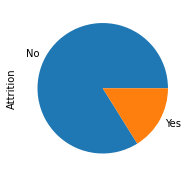

In [28]:
# Distribution of Attrition
df['Attrition'].value_counts().plot(kind='pie',figsize=(5,3))

In [61]:
df.corr()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,0.010661,-0.001686,0.208034,NaN,-0.010145,0.010146,0.024287,0.029820,0.509604,...,0.053535,NaN,0.037510,0.680381,-0.019621,-0.021490,0.311309,0.212901,0.216513,0.202089
DailyRate,0.010661,1.000000,-0.004985,-0.016806,NaN,-0.050990,0.018355,0.023381,0.046135,0.002966,...,0.007846,NaN,0.042143,0.014515,0.002453,-0.037848,-0.034055,0.009932,-0.033229,-0.026363
DistanceFromHome,-0.001686,-0.004985,1.000000,0.021042,NaN,0.032916,-0.016075,0.031131,0.008783,0.005303,...,0.006557,NaN,0.044872,0.004628,-0.036942,-0.026556,0.009508,0.018845,0.010029,0.014406
Education,0.208034,-0.016806,0.021042,1.000000,NaN,0.042070,-0.027128,0.016775,0.042438,0.101589,...,-0.009118,NaN,0.018422,0.148280,-0.025100,0.009819,0.069114,0.060236,0.054254,0.069065
EmployeeCount,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EmployeeNumber,-0.010145,-0.050990,0.032916,0.042070,NaN,1.000000,0.017621,0.035179,-0.006888,-0.018519,...,-0.069861,NaN,0.062227,-0.014365,0.023603,0.010309,-0.011240,-0.008416,-0.009019,-0.009197
EnvironmentSatisfaction,0.010146,0.018355,-0.016075,-0.027128,NaN,0.017621,1.000000,-0.049857,-0.008278,0.001212,...,0.007665,NaN,0.003432,-0.002693,-0.019359,0.027627,0.001458,0.018007,0.016194,-0.004999
HourlyRate,0.024287,0.023381,0.031131,0.016775,NaN,0.035179,-0.049857,1.000000,0.042861,-0.027853,...,0.001330,NaN,0.050263,-0.002334,-0.008548,-0.004607,-0.019582,-0.024106,-0.026716,-0.020123
JobInvolvement,0.029820,0.046135,0.008783,0.042438,NaN,-0.006888,-0.008278,0.042861,1.000000,-0.012630,...,0.034297,NaN,0.021523,-0.005533,-0.015338,-0.014617,-0.021355,0.008717,-0.024184,0.025976
JobLevel,0.509604,0.002966,0.005303,0.101589,NaN,-0.018519,0.001212,-0.027853,-0.012630,1.000000,...,0.021642,NaN,0.013984,0.782208,-0.018191,0.037818,0.534739,0.389447,0.353885,0.375281


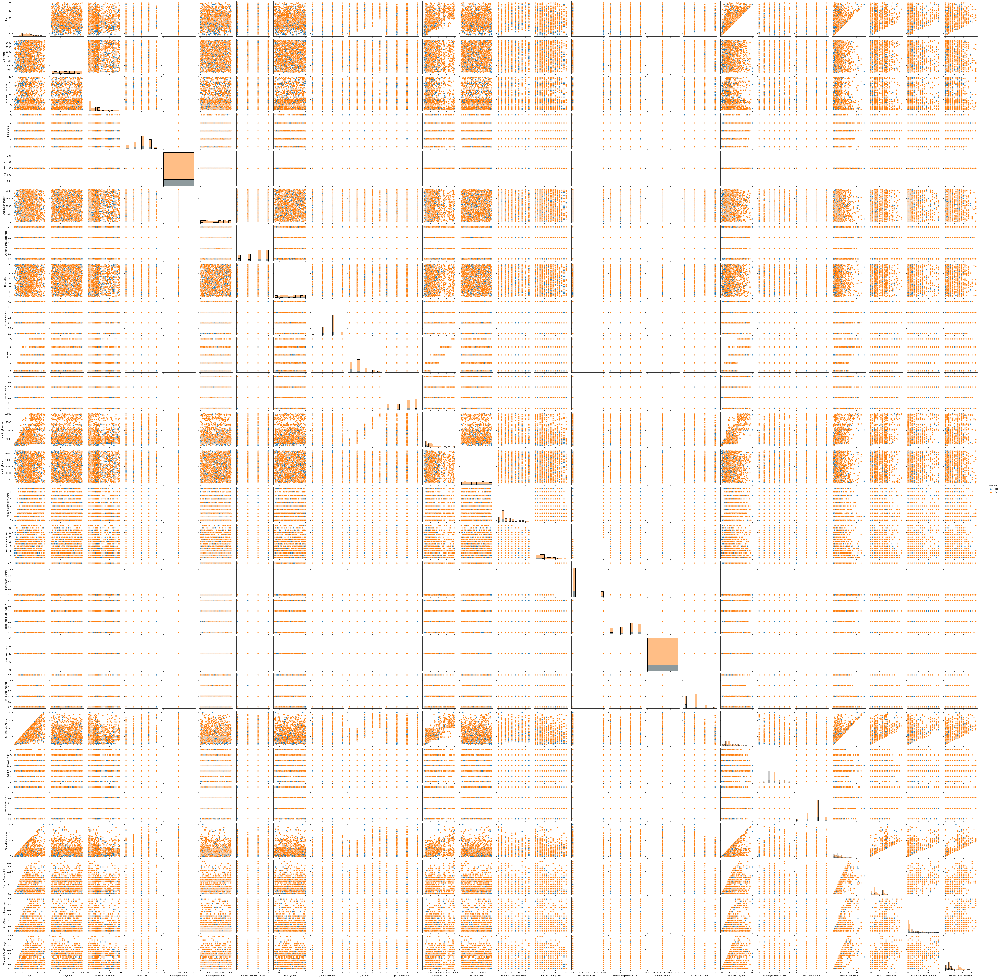

In [111]:
sns.pairplot(df, hue="Attrition", diag_kind="hist")

<AxesSubplot:>

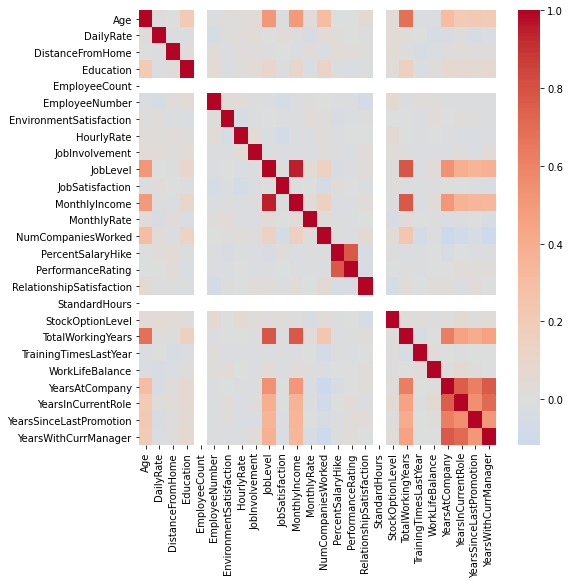

In [50]:
# Checking with heatmap tp help with visualization of correlations between variables
sns.heatmap (df.corr(), center=0 , cmap='coolwarm')

In [ ]:
# Observations:
'''
- Time variables such as # of years in the company, in the same position, with the same manager and since last promotion 
are highly correlated, so I will keep only one of them: Years at Company.
- Total working years shows a high correlation with Age, Job Level, Monthly income and Job Satisfaction.
- Job Level is also highly correlated with Monthly income.

In [125]:
# Dropping columns that are not relevant
df = df.drop(['YearsWithCurrManager', 'YearsSinceLastPromotion', 'YearsInCurrentRole', 'Over18'], axis=1)
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany'],
      dtype='object')

# 2. Variables Analysis

In [ ]:
# Apart from the observations above I'm choosing some other variables to explore to evaluate for the model

# 2.1 Age

<AxesSubplot:xlabel='Age', ylabel='count'>

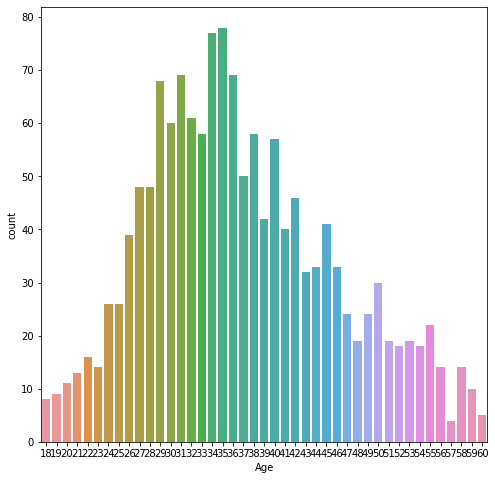

In [51]:
# Age Distribution
sns.countplot (data=df, x='Age')

<AxesSubplot:xlabel='Attrition', ylabel='Age'>

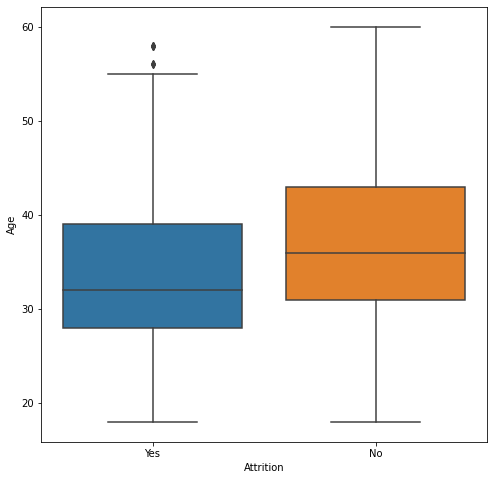

In [52]:
# How is Age connected to attrition? We see that the Age range of people that leave the company is between 28 and 39 years-old.
sns.boxplot(data=df, x='Attrition', y ='Age')

# 2.2 Gender

<AxesSubplot:xlabel='Attrition', ylabel='count'>

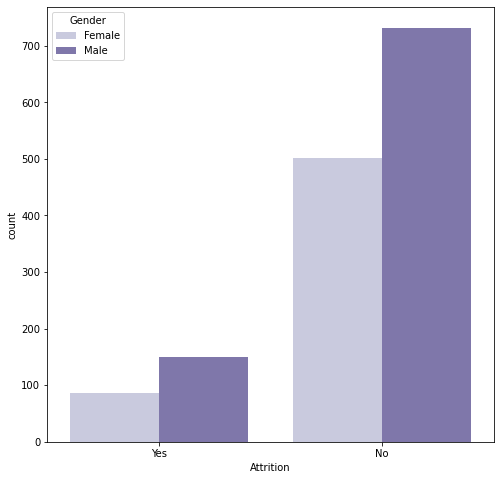

In [53]:
# Gender / Attrition - Male are the ones who most leave the company
sns.countplot(data=df, x='Attrition', hue='Gender', palette='Purples')

In [137]:
df['Gender'].value_counts()

Male      882
Female    588
Name: Gender, dtype: int64

Text(0, 0.5, 'Monthly Income')

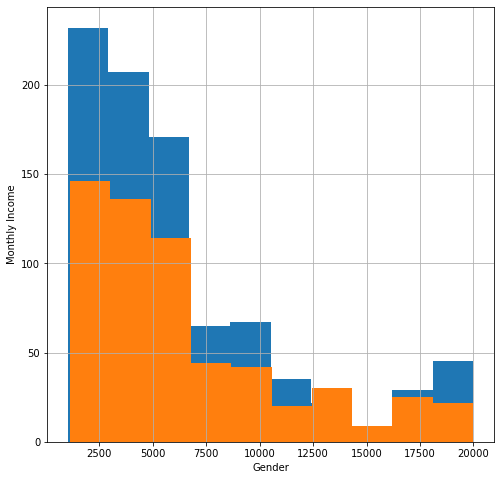

In [54]:
# Gender / Monthly Income - We see gender pay gap as male have the higher salaries
df [df.Gender=='Male'].MonthlyIncome.hist()
df [df.Gender=='Female'].MonthlyIncome.hist()
plt.xlabel("Gender")
plt.ylabel("Monthly Income")

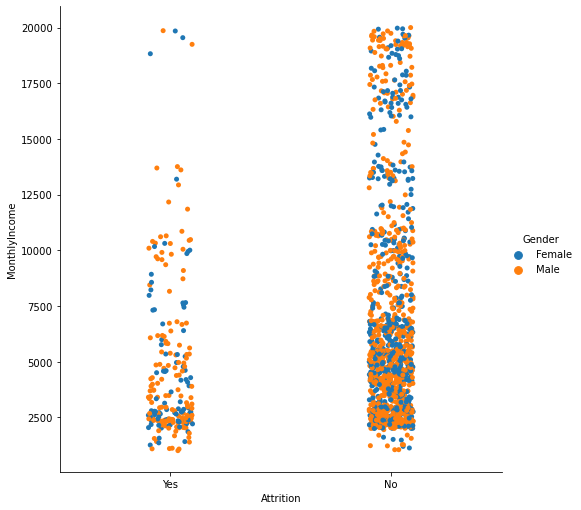

In [55]:
# Attrition / Monthly Income by Gender - People that leave are the ones with lower salaries, but gender doesn't affect much
sns.catplot(x="Attrition", y="MonthlyIncome", data=df,hue='Gender',height=7)
plt.show()

In [138]:
#Crosstab to check correlation between Attrition and Gender
ct_gender = pd.crosstab(index=df['Attrition'],columns=df['Gender'])
print(ct_gender)

Gender     Female  Male
Attrition              
No            501   732
Yes            87   150


In [124]:
# Performing Chi-sq test we see the result is higher than 0.05, meaning that my hypotesis is not null, so I can discard Gender column
ChiSqResult = chi2_contingency(ct_gender) 
print('The P-Value of the ChiSq Test is:', ChiSqResult[1])

The P-Value of the ChiSq Test is: 0.29057244902890855


# 2.3 Years at Company

<AxesSubplot:xlabel='Attrition', ylabel='YearsAtCompany'>

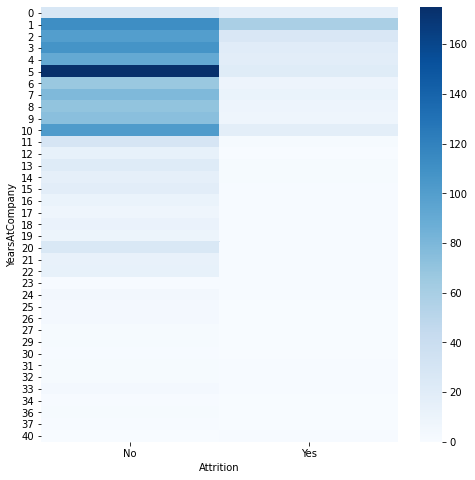

In [60]:
# Attrition / Years at Company - Leavers in general have less then 10 years working at the company
sns.heatmap(pd.crosstab(df['YearsAtCompany'],df['Attrition']), cmap='Blues')

# 2.4 Overtime

In [81]:
#Checking the Overtime variable
df['OverTime'].value_counts()

No     1054
Yes     416
Name: OverTime, dtype: int64

In [91]:
#Crosstab to check correlation between Attrition and Overtime
ct_overtime = pd.crosstab(index=df['Attrition'],columns=df['OverTime'])
print(ct_overtime)

OverTime    No  Yes
Attrition          
No         944  289
Yes        110  127


<AxesSubplot:xlabel='Attrition'>

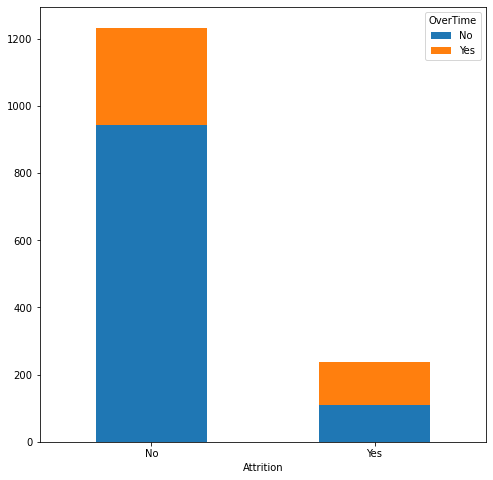

In [92]:
# It's possible to see that Attrition is higher on people that work Overtime
ct_overtime.plot(kind="bar", stacked=True, rot=0)

In [93]:
# Performing Chi-sq test we see the result is lower than 0.05, meaning that I cannot discard Overtime variable
ChiSqResult = chi2_contingency(ct_overtime) 
print('The P-Value of the ChiSq Test is:', ChiSqResult[1])

The P-Value of the ChiSq Test is: 8.15842372153832e-21


# 2.5 Business Travel

In [126]:
#Checking the Business Travel variable
df['BusinessTravel'].value_counts()

Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64

In [130]:
#Crosstab to check correlation between Attrition and Business Travel
ct_travel = pd.crosstab(index=df['Attrition'],columns=df['BusinessTravel'])
print(ct_travel)

BusinessTravel  Non-Travel  Travel_Frequently  Travel_Rarely
Attrition                                                   
No                     138                208            887
Yes                     12                 69            156


<AxesSubplot:xlabel='Attrition'>

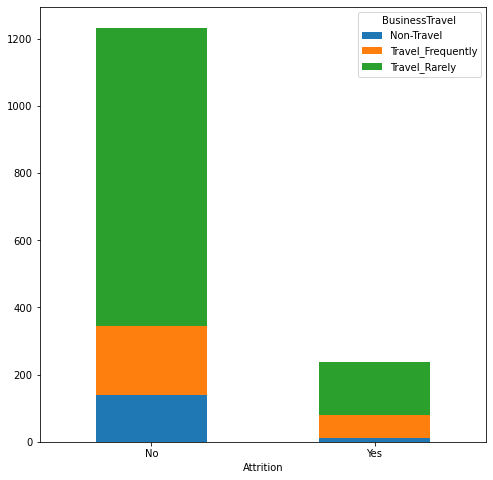

In [131]:
# It's possible to see that Business Travel doesn't affect Attrition negatively
ct_travel.plot(kind="bar", stacked=True, rot=0)

# 3. Hypotesis

In [ ]:
''' My observations allow me to select 3 hypotesis:
- People with less than 10 years in the company are more likely to leave
- Attrition is higher on people that work Overtime
- People that Travel frequently show lower attrition than who doesn't
'''

In [132]:
# All the variables I chose are categorical XD
df.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears            int64
TrainingTimesLastYea

In [133]:
# Turning my Target into a numerical category
df['Attrition'] = df['Attrition'].apply(lambda x: 1 if x=='Yes' else 0)

In [134]:
df['Attrition'].value_counts()

0    1233
1     237
Name: Attrition, dtype: int64

# 3.1 Years at Company

In [135]:
# Creating bins for years at Company
df['YearsAtCompany'] = pd.cut(df['YearsAtCompany'], [1,10,40], labels=['1<>10', '10<>40'])

In [136]:
df['YearsAtCompany'].value_counts()

1<>10     1009
10<>40     246
Name: YearsAtCompany, dtype: int64

In [137]:
#Crosstab to check corr for Hypothesis Testing
ct_years = pd.crosstab(index=df['Attrition'],columns=df['YearsAtCompany'])
print(ct_years)

YearsAtCompany  1<>10  10<>40
Attrition                    
0                 867     226
1                 142      20


In [138]:
df['YearsAtCompany'].dtypes

CategoricalDtype(categories=['1<>10', '10<>40'], ordered=True)

In [139]:
# Turning YearsAtCompany into a numerical category
df['YearsAtCompany'] = df['YearsAtCompany'].apply(lambda x: 1 if x=='1<>10' else 0)

In [140]:
#Crosstab to check corr for Hypothesis Testing
ct_years = pd.crosstab(index=df['Attrition'],columns=df['YearsAtCompany'])
print(ct_years)

YearsAtCompany    1    0
Attrition               
0               867  226
1               142   20


In [107]:
# Testing if the hypotesis of people with less than 10 years at company are more likely to leave 
sample = (df['YearsAtCompany'][(df['Attrition'] == 1)]).dropna(axis=0)
years = 1
stats, p_value = stats.ttest_1samp(sample, years)
p_value

# P_value is lower than 0.05, it means that YearsAtCompany does affect Attrition, so I should consider it on the model.

4.247466893717831e-06

# 3.2 Overtime

In [141]:
# Turning Overtime column into a numerical category
df['OverTime'] = df['OverTime'].apply(lambda x: 1 if x=='Yes' else 0)

In [142]:
df['OverTime'].value_counts()

0    1054
1     416
Name: OverTime, dtype: int64

In [307]:
# Testing if the hypotesis of people that work overtime are more likely to leave 
sample = (df['OverTime'][(df['Attrition'] == 1)]).dropna(axis=0)
years = 1
stats, p_value = stats.ttest_1samp(sample, years)
p_value

# P_value is lower than 0.05, it means that Overtime does affect Attrition, so I should consider it on the model.

8.09382893270555e-34

# 3.3 Business Travel

In [143]:
# I'm going to reduce Business Travels to 2 bins, where Travel_Rarely and Non-Travel are Yes and Travel_Frequently is No
df['BusinessTravel'].replace({"Travel_Rarely": "1", "Non-Travel": "1", "Travel_Frequently": "0"}, inplace=True)
df['BusinessTravel'].value_counts()

1    1193
0     277
Name: BusinessTravel, dtype: int64

In [312]:
# Testing if the hypotesis of people that don't go on Business Travels are more likely to leave 
sample = (df['BusinessTravel'][(df['Attrition'] == 1)]).dropna(axis=0)
years = 1
stats, p_value = stats.ttest_1samp(sample, years)
p_value

# P_value is lower than 0.05, it means that No Business Travels does affect Attrition, so I should consider it on the model.

2.2122205348635862e-19

# 3.4 Adaptations

In [155]:
# Converting Years and Travel into Numerical
df['BusinessTravel'] = df['BusinessTravel'].astype(str).astype(int)
df['YearsAtCompany'] = df['YearsAtCompany'].astype(str).astype(float)
df['YearsAtCompany'] = df['YearsAtCompany'].fillna(0)

In [148]:
# I'm going to dropping the other categorical variables that are not relevant for my analisys - Gender already tested
df = df.drop(['Gender', 'Department', 'EducationField', 'JobRole', 'MaritalStatus'], axis=1)

In [158]:
# I'm also dropping the columns DailyRate, Hourly Rate, EmployeeCount, StandardHours, EmployeeNumber as these doesn't help in model building
df = df.drop(['EmployeeCount', 'StandardHours', 'EmployeeNumber', 'DailyRate', 'HourlyRate','PercentSalaryHike'], axis=1)
df.dtypes

Age                           int64
Attrition                     int64
BusinessTravel                int32
DistanceFromHome              int64
Education                     int64
EnvironmentSatisfaction       int64
JobInvolvement                int64
JobLevel                      int64
JobSatisfaction               int64
MonthlyIncome                 int64
MonthlyRate                   int64
NumCompaniesWorked            int64
OverTime                      int64
PerformanceRating             int64
RelationshipSatisfaction      int64
StockOptionLevel              int64
TotalWorkingYears             int64
TrainingTimesLastYear         int64
WorkLifeBalance               int64
YearsAtCompany              float64
dtype: object

In [163]:
print("Number of unique values")
for column in df.columns:
    print(f"{column}: {df[column].nunique()}")

Number of unique values
Age: 43
Attrition: 2
BusinessTravel: 2
DistanceFromHome: 29
Education: 5
EnvironmentSatisfaction: 4
JobInvolvement: 4
JobLevel: 5
JobSatisfaction: 4
MonthlyIncome: 1349
MonthlyRate: 1427
NumCompaniesWorked: 10
OverTime: 2
PerformanceRating: 2
RelationshipSatisfaction: 4
StockOptionLevel: 4
TotalWorkingYears: 40
TrainingTimesLastYear: 7
WorkLifeBalance: 4
YearsAtCompany: 2


<AxesSubplot:>

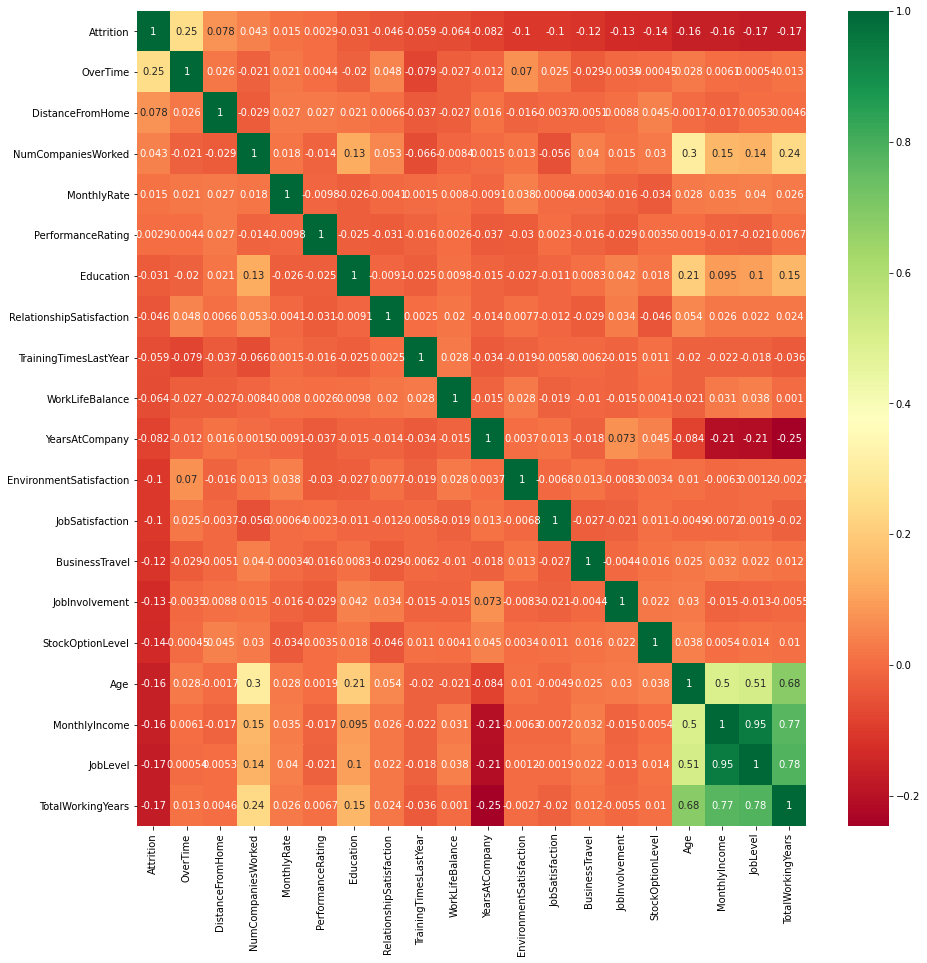

In [164]:
col = df.corr().nlargest(20, "Attrition").Attrition.index
plt.figure(figsize=(15, 15))
sns.heatmap(df[col].corr(), annot=True, cmap="RdYlGn", annot_kws={"size":10})

In [ ]:
# More observations
'''
- Total working years shows a high correlation with Age, Job Level and Monthly income.
- Job Level is also highly correlated with Monthly income.
'''

# 4. Models

# 4.1 Linear regression (with Monthly Income)

In [280]:
X = df.drop (['MonthlyIncome'], axis=1)
y = df['MonthlyIncome']

In [291]:
X

,Age,Attrition,BusinessTravel,DistanceFromHome,Education,EnvironmentSatisfaction,JobInvolvement,JobLevel,JobSatisfaction,MonthlyRate,NumCompaniesWorked,OverTime,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany
0,41,1,1,1,2,2,3,2,4,19479,8,1,3,1,0,8,0,1,1.0
1,49,0,0,8,1,3,2,2,2,24907,1,0,4,4,1,10,3,3,1.0
2,37,1,1,2,2,4,2,1,3,2396,6,1,3,2,0,7,3,3,0.0
3,33,0,0,3,4,4,3,1,3,23159,1,1,3,3,0,8,3,3,1.0
4,27,0,1,2,1,1,3,1,2,16632,9,0,3,4,1,6,3,3,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0,0,23,2,3,4,2,4,12290,4,0,3,3,1,17,3,3,1.0
1466,39,0,1,6,1,4,2,3,1,21457,4,0,3,1,1,9,5,3,1.0
1467,27,0,1,4,3,2,4,2,2,5174,1,1,4,2,1,6,0,3,1.0
1468,49,0,0,2,3,4,2,2,2,13243,2,0,3,4,0,17,3,2,1.0


In [281]:
X_train, X_test, y_train, y_test = train_test_split (X, y, test_size = 0.25, random_state = 42)

In [282]:
linear_regress = LinearRegression()

In [283]:
linear_regress.fit(X_train,y_train)

LinearRegression()

In [284]:
y_pred = linear_regress.predict(X_test)

In [285]:
mean_squared_error(y_test, y_pred)

2229292.8079308798

In [286]:
stats.linregress(list(x['Attrition']), list(y))

LinregressResult(slope=-2045.6468323631793, intercept=6832.7396593673975, rvalue=-0.1598395823849888, pvalue=7.147363985353653e-10, stderr=329.7337222127719, intercept_stderr=132.39722142083212)

In [287]:
print(linear_regress.intercept_, linear_regress.coef_)

-1343.1601587044943 [-8.20871982e+00  3.69462021e+01  1.46160913e+02 -1.19767974e+01
 -6.93490874e+00 -4.52109250e+01  5.26111911e+00  3.85019321e+03
 -4.03841485e+01 -1.64412095e-03  2.30567521e+01  5.88408957e+01
 -1.68838901e+01  4.66406422e+01 -1.52231676e+01  4.42014478e+01
  6.38911284e-01 -5.30353991e+01 -3.01912490e+01]


In [288]:
stats.pearsonr(y_test,y_pred)

(0.9480161685927738, 4.388220796536133e-184)

In [289]:
df_LR = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
df_LR.head()

,Actual,Predicted
1041,8463,6163.167194
184,4450,5770.922490
1222,1555,1890.401184
67,9724,10801.003350
220,5914,6689.303248


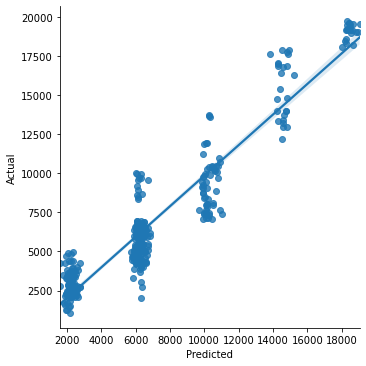

In [290]:
sns.lmplot(x = 'Predicted', y = 'Actual', data = df_LR)

In [ ]:
# The model is quite good to predict Monthly Income.

# 4.2 Logistic regression

In [294]:
X = df.drop (['Attrition'], axis=1)
y = df['Attrition']

X_train, X_test, y_train, y_test = train_test_split (X, y, test_size = 0.25, random_state = 42, stratify=y)

In [295]:
scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)
X_std = scaler.transform(X)

In [296]:
# We have an imbalanced data, so if we predict that all employees will stay we'll have an accuracy of 83.96%
y_test.value_counts()[0] / y_test.shape[0]

0.8396739130434783

In [297]:
model = LogisticRegression(max_iter=1000)

In [298]:
model.fit(X_train, y_train)

LogisticRegression(max_iter=1000)

In [299]:
model.score(X_test, y_test)

0.8396739130434783

In [300]:
y_pred = model.predict (X_test)
y_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,

In [301]:
print (classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.84      0.99      0.91       309
           1       0.50      0.03      0.06        59

    accuracy                           0.84       368
   macro avg       0.67      0.51      0.49       368
weighted avg       0.79      0.84      0.78       368



In [302]:
precision_score(y_test, y_pred)

0.5

In [303]:
recall_score(y_test, y_pred)

0.03389830508474576

In [304]:
# media harmonica de la precision y recall, mas ajustada
f1_score(y_test, y_pred)

0.06349206349206349

In [305]:
confusion_matrix(y_test, y_pred)

array([[307,   2],
       [ 57,   2]], dtype=int64)

<AxesSubplot:>

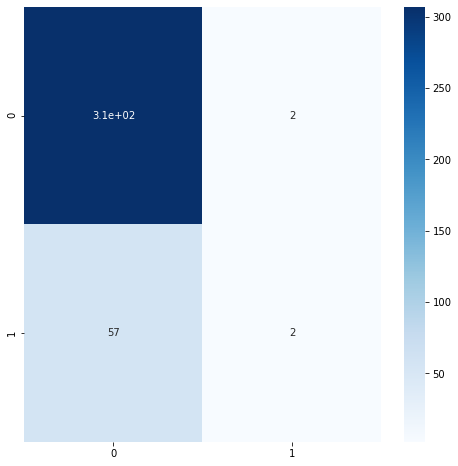

In [306]:
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, cmap='Blues')

In [308]:
# Although the score is good, the recall is too low and with Confusion Matrix we see that the model is not good as we have an imbalanced data

# 4.3 Statsmodel

In [198]:
models = sm.OLS(y, x).fit()

In [199]:
print(models.summary())

                                 OLS Regression Results                                
Dep. Variable:              Attrition   R-squared (uncentered):                   1.000
Model:                            OLS   Adj. R-squared (uncentered):              1.000
Method:                 Least Squares   F-statistic:                          1.324e+34
Date:                Sat, 29 Jan 2022   Prob (F-statistic):                        0.00
Time:                        03:01:18   Log-Likelihood:                          51644.
No. Observations:                1470   AIC:                                 -1.033e+05
Df Residuals:                    1469   BIC:                                 -1.033e+05
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------